In [3]:
import networkx as nx
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import collections
import seaborn as sns
import plotly.express as px
from scipy.stats import linregress


In [4]:
def clean_dataframe(dataframe): #questa funzione pulisce il df eliminando le colonne inutili e droppa i NaN
  df = pd.read_csv(dataframe, low_memory = False)
  new_df = pd.DataFrame(df, columns=['White', 'Black', 'Result', 'Date', 'Opening'])
  new_df.dropna()
  return new_df


def drop_entries_less_than_n(df, columns, n): #questa è la funzione di Luca che crea un nuovo df togliendo le i nodi che hanno degree<n, l'ho tenuta solo per bellezza xk non credo la useremo
    combined_list = df[columns].values.flatten().tolist()
    count_series = pd.Series(combined_list).value_counts()
    count_df = pd.DataFrame({'Element': count_series.index, 'Count': count_series.values})
    entries_to_drop = count_df[count_df['Count'] < n]['Element'].tolist()
    df = df[~df[columns].apply(lambda x: x[0] in entries_to_drop and x[1] in entries_to_drop, axis=1)]
    return df, count_df

def create_network_from_dataframe(df): #ritorna il network creato partendo da un df pulito
   G = nx.from_pandas_edgelist(df, source='White', target='Black')
   return G

def draw_and_save_network(G,node_size,with_labels,path): #visualizza e salva in locale un network, prende G, la node-size e un bool se vogliamo mettere o no i labels e il percorso-nome in cui salvare
   fig = nx.draw(G, node_size=node_size, with_labels = with_labels)
   plt.savefig(path)
   plt.show()

def plot_histogram_with_vertical_labels(Names_x_axis,observable): #plotta e salva l'istogramma di un'osservabile coi nomi in verticale e.g. degree dei primi 50 giocatori
   plt.bar(Names_x_axis,observable)
   plt.xticks(rotation='vertical')
   plt.savefig('./histogram_with_vertical_labels.png')
   plt.show()

def network_diameter(G):
   return nx.diameter(G)


def create_connected_components_of_network(G):
   S = [G.subgraph(c).copy() for c in nx.connected_components(G)]
   return S

def central_cluster_of_network(G):
   largest_cc = max(nx.connected_components(G), key=len)
   cc = G.subgraph(largest_cc).copy()
   return cc

def get_degree_list(G): #questa ritorna 2 liste: la lista delle degree dei giocatori e la lista dei nomi dei giocatori
   degree = dict(G.degree())
   names_list=list(degree.keys())
   degree_list=list(degree.values())
   return degree_list,names_list

def get_betweenness_list(G,normalized): #questa prende il network e la bool che dice se vogliamo la betwenness normalizzata o no e ritorna 2 liste: la lista delle betwenness e la lista dei nomi dei giocatori
   bet=dict(nx.betweenness_centrality(G,normalized=normalized))
   names_list=list(bet.keys())
   bet_list=list(bet.values())
   return bet_list,names_list

def raw_sorting_algorithm(list_to_sort,connected_list): #questa ordina 2 liste. list_to_sort è la lista su cui si ha il controllo dell'ordinamento in senso decrescente, connected_list è la lista collaterale che viene ordinata seguendo l'altra, ritorna le liste ordinate
   for i in range(len(list_to_sort)):
      for j in range(len(list_to_sort)-1):
         if list_to_sort[j]<list_to_sort[j+1]:
            var = list_to_sort[j]
            list_to_sort[j]=list_to_sort[j+1]
            list_to_sort[j+1] = var
            var= connected_list[j]
            connected_list[j]=connected_list[j+1]
            connected_list[j+1] = var
   return list_to_sort,connected_list

def intersection_of_lists(list1,list2): #ritorna la lista degli elementi in comune tra due liste passate come parametri
   intersection=[]
   for item in list1:
      if item in list2:
         intersection.append(item)
   return intersection

def create_df_with_names_degree_betweenness(Names,degree,betweenness):#prende le liste con nomi,degree e betweenness e ne crea un df
   d = {'Name': Names, 'Degree':degree,
   'Betweenness':betweenness }
   df= pd.DataFrame(data=d)
   return df

def scatterplot(df,feature1,feature2,labels,color):#fa scatterplot e printa dato il df di partenza, le due colonne che saranno x e y, la colonna dei labels e quella dei colori. Si downloada direttamente, non si salva
   fig = px.scatter(data_frame=df, x=feature1, y=feature2, hover_name=labels, color=color)
   fig.show()

def linear_regression(x,y):#ritorna il coef.angolare, l'intercetta e il coef. di correlazione tra due liste x e y
   result = linregress(x=x,y=y)
   return result.slope,result.intercept,result.rvalue


In [5]:
correl_coeff = []

In [11]:
 df_2015 = clean_dataframe(file_names[0])
 df_65 = clean_dataframe(file_names[1])
 df_70 = clean_dataframe(file_names[2])
 df_2000 = clean_dataframe(file_names[3])
 df_2010 = clean_dataframe(file_names[4])
 df_60 = clean_dataframe(file_names[5])
 df_75 = clean_dataframe(file_names[6])
#skippa uno del 2005 
 df_2020 = clean_dataframe(file_names[8])
 df_50 = clean_dataframe(file_names[9])
 df_90 = clean_dataframe(file_names[10])
 df_85 = clean_dataframe(file_names[11])
 df_95 = clean_dataframe(file_names[12])
 df_80 = clean_dataframe(file_names[13])
 df_55 = clean_dataframe(file_names[14])




In [ ]:
/Users/alex/chess_data/dati task/chess_data_50.csv

In [ ]:
G=create_network_from_dataframe(df_80)
#draw_and_save_network(G,1,False,'./network')
central_subgraph=central_cluster_of_network(G)
degree,names= get_degree_list(G)
betweenness_list= get_betweenness_list(G,True)[0]
values_df=create_df_with_names_degree_betweenness(names_list,degree_list,betweenness_list)
correl_coefficient=linear_regression(degree_list,betweenness_list)[2]
scatterplot(values_df,'Degree','Betweenness','Name','Degree')
correl_coeff.append(correl_coefficient)

In [9]:
nomi = []
for file in file_names:
  year = re.match(r"(.+?)_(\d+).csv", file).group(2)
  nomi.append(year)

In [10]:
nomi

['2015',
 '65',
 '70',
 '2000',
 '2010',
 '60',
 '75',
 '2005',
 '2020',
 '50',
 '90',
 '85',
 '95',
 '80',
 '55']

In [6]:
import glob
file_names = []
for file in glob.glob('/Users/alex/chess_data/dati task/*.csv'):
  file_names.append(file)
file_names

['/Users/alex/chess_data/dati task/chess_data_2015.csv',
 '/Users/alex/chess_data/dati task/chess_data_65.csv',
 '/Users/alex/chess_data/dati task/chess_data_70.csv',
 '/Users/alex/chess_data/dati task/chess_data_2000.csv',
 '/Users/alex/chess_data/dati task/chess_data_2010.csv',
 '/Users/alex/chess_data/dati task/chess_data_60.csv',
 '/Users/alex/chess_data/dati task/chess_data_75.csv',
 '/Users/alex/chess_data/dati task/chess_data_2005.csv',
 '/Users/alex/chess_data/dati task/chess_data_2020.csv',
 '/Users/alex/chess_data/dati task/chess_data_50.csv',
 '/Users/alex/chess_data/dati task/chess_data_90.csv',
 '/Users/alex/chess_data/dati task/chess_data_85.csv',
 '/Users/alex/chess_data/dati task/chess_data_95.csv',
 '/Users/alex/chess_data/dati task/chess_data_80.csv',
 '/Users/alex/chess_data/dati task/chess_data_55.csv']

In [8]:
import re

In [16]:
lista_corr = []
for file in file_names:
    if (file != '/Users/alex/chess_data/dati task/chess_data_2005.csv'):
      degree_list = []
      names_list = []
      df = clean_dataframe(file)
      year = re.match(r"(.+?)_(\d+).csv", file).group(2)
      print('Processando anno: ', year)
      G=create_network_from_dataframe(df)
      central_subgraph=central_cluster_of_network(G)
      degree,names = get_degree_list(G)
      betweenness_list= get_betweenness_list(G,True)[0]
      values_df=create_df_with_names_degree_betweenness(names,degree,betweenness_list)
      correl_coefficient=linear_regression(degree,betweenness_list)[2]
      print(correl_coefficient)
      lista_corr.append(correl_coefficient)
      #corr_dict = {year: correl_coefficient}
      scatterplot(values_df,'Degree','Betweenness','Name','Degree')


Processando anno:  2015
0.802497941222279


Processando anno:  65
0.4352322078719475


Processando anno:  70
0.45287551398433945


Processando anno:  2000
0.6021571914866447


Processando anno:  2010
0.46441289704531497


Processando anno:  60
0.7369381670830126


Processando anno:  75
0.49207273747347285


Processando anno:  2020
0.6929192467617888


Processando anno:  50
0.6466483366976419


Processando anno:  90
0.7076539491410654


Processando anno:  85
0.047657656644977064


Processando anno:  95
0.7277692546470217


Processando anno:  80
0.5758708129501415


Processando anno:  55
0.5175351345747368


In [17]:
lista_corr

[0.802497941222279,
 0.4352322078719475,
 0.45287551398433945,
 0.6021571914866447,
 0.46441289704531497,
 0.7369381670830126,
 0.49207273747347285,
 0.6929192467617888,
 0.6466483366976419,
 0.7076539491410654,
 0.047657656644977064,
 0.7277692546470217,
 0.5758708129501415,
 0.5175351345747368]

In [18]:
anni_plot = []
for nome in nomi:
    if nome != '2005':
        anni_plot.append(nome)
        

In [19]:
anni_plot

['2015',
 '65',
 '70',
 '2000',
 '2010',
 '60',
 '75',
 '2020',
 '50',
 '90',
 '85',
 '95',
 '80',
 '55']

Text(0.5, 1.0, 'Correlation coefficient in time ')

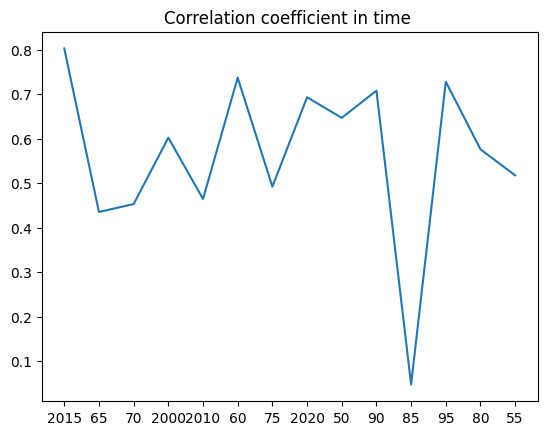

In [23]:
sns.lineplot(x=anni_plot, y = lista_corr)
plt.title('Correlation coefficient in time ')

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13],
 [Text(0, 0, '1950'),
  Text(1, 0, '1955'),
  Text(2, 0, '1960'),
  Text(3, 0, '1965'),
  Text(4, 0, '1970'),
  Text(5, 0, '1975'),
  Text(6, 0, '1980'),
  Text(7, 0, '1985'),
  Text(8, 0, '1990'),
  Text(9, 0, '1995'),
  Text(10, 0, '2000'),
  Text(11, 0, '2010'),
  Text(12, 0, '2015'),
  Text(13, 0, '2020')])

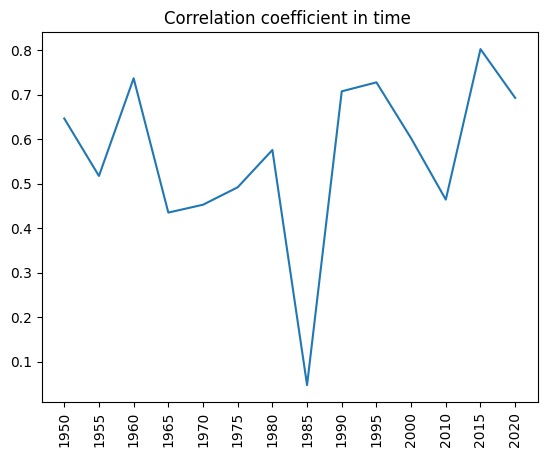

In [35]:
sns.lineplot(x= sorted_years, y = sorted_values)
plt.title('Correlation coefficient in time ')
plt.xticks(rotation='vertical')

In [24]:
lista_corr

[0.802497941222279,
 0.4352322078719475,
 0.45287551398433945,
 0.6021571914866447,
 0.46441289704531497,
 0.7369381670830126,
 0.49207273747347285,
 0.6929192467617888,
 0.6466483366976419,
 0.7076539491410654,
 0.047657656644977064,
 0.7277692546470217,
 0.5758708129501415,
 0.5175351345747368]

In [25]:
lista_anni = ['2015',
 '1965',
 '1970',
 '2000',
 '2010',
 '1960',
 '1975',
 '2020',
 '1950',
 '1990',
 '1985',
 '1995',
 '1980',
 '1955']

In [26]:
sorted_years = sorted(lista_anni)

In [30]:
sorted_values = []
for year in sorted_years:
  index = lista_anni.index(year)
  sorted_values.append(lista_corr[index])


In [31]:
lista_corr

[0.802497941222279,
 0.4352322078719475,
 0.45287551398433945,
 0.6021571914866447,
 0.46441289704531497,
 0.7369381670830126,
 0.49207273747347285,
 0.6929192467617888,
 0.6466483366976419,
 0.7076539491410654,
 0.047657656644977064,
 0.7277692546470217,
 0.5758708129501415,
 0.5175351345747368]

In [32]:
sorted_values

[0.6466483366976419,
 0.5175351345747368,
 0.7369381670830126,
 0.4352322078719475,
 0.45287551398433945,
 0.49207273747347285,
 0.5758708129501415,
 0.047657656644977064,
 0.7076539491410654,
 0.7277692546470217,
 0.6021571914866447,
 0.46441289704531497,
 0.802497941222279,
 0.6929192467617888]

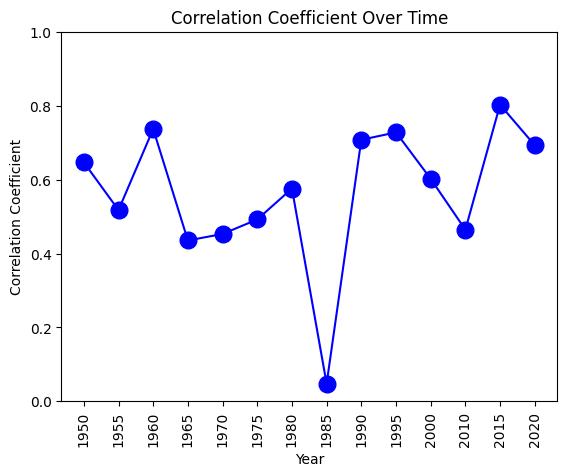

In [40]:
plt.plot(sorted_years, sorted_values, color='blue', marker='o', markersize=12, ls='-')
plt.xlabel('Year')
plt.ylabel('Correlation Coefficient')
plt.title('Correlation Coefficient Over Time')
plt.xticks(rotation='vertical')
plt.ylim(0,1)
plt.show()